# 2D Soft Body Dynamics: SDF Terrain Collision

This tutorial extends the implicit FEM solver with **Signed Distance Field (SDF)** based collision for arbitrary terrain.

**Learning Goals:**
1. Understand what SDFs are and why they're useful for collision
2. Implement bilinear SDF sampling on GPU
3. Build a collision response kernel using SDF gradients
4. Simulate soft bodies on complex terrain

**Prerequisites:** Complete [04_reduction.ipynb](04_reduction.ipynb) first!

## 1. What is a Signed Distance Field?

An **SDF** is a 2D field where each pixel stores the distance to the nearest boundary:
- **Positive** = inside passable area (free space)
- **Negative** = inside wall (collision)
- **Zero** = exactly on the boundary

**Benefits for collision:**
- **O(1) lookup** per particle - just sample the field!
- **Smooth normals** - gradient gives continuous surface direction
- **Arbitrary geometry** - any shape from a bitmap image
- **Resolution independent** - bilinear interpolation gives sub-pixel precision

## 2. Collision Detection Algorithm

For each particle:
1. **Convert** world position to pixel coordinates
2. **Sample** SDF at that location (bilinear interpolation)
3. **Check** if SDF < 0 (inside wall)
4. **Response**: Push out along gradient (surface normal) + reflect velocity

---
## 3. Implementation

Step-by-step GPU implementation using Warp.

In [1]:
# Step 1: Imports
import numpy as np
import warp as wp
from warp.optim.linear import bicgstab, preconditioner
from warp.sparse import bsr_zeros, bsr_set_from_triplets
from scipy.spatial import Delaunay
from scipy import ndimage
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.tri import Triangulation
from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.collections import LineCollection
from matplotlib.colors import LinearSegmentedColormap
from IPython.display import Image as IPImage
import time

# Import shared utilities from previous tutorials
from utils import (
    State, Model,
    eval_spring_2d, eval_fem_2d, apply_boundary_2d,
    build_spring_matrix_2d, build_fem_matrix_2d,
    update_state_2d, eval_gravity_2d,
    create_spring_colormap, create_fem_colormap
)

wp.init()
print(f"Warp {wp.__version__} on {wp.get_device()}")

Warp 1.11.0.dev20251123 initialized:
   Git commit: 8b8f0b85ca54c0026574f834764e26615056aef6
   CUDA Toolkit 12.8, Driver 13.0
   Devices:
     "cpu"      : "x86_64"
     "cuda:0"   : "NVIDIA L40S" (44 GiB, sm_89, mempool enabled)
   Kernel cache:
     /root/.cache/warp/1.11.0.dev20251123
Warp 1.11.0.dev20251123 on cuda:0


### 3.1 SDF Sampling Function

Bilinear interpolation for smooth SDF sampling on GPU.

In [2]:
# Step 2: SDF Bilinear Sampling Function
@wp.func
def bilinear_sample(
    data: wp.array2d(dtype=float),
    px: float, py: float,
    width: int, height: int,
) -> float:
    """Sample 2D array with bilinear interpolation."""
    # Clamp to valid range
    px = wp.clamp(px, 0.0, float(width) - 1.001)
    py = wp.clamp(py, 0.0, float(height) - 1.001)
    
    # Get integer coordinates
    x0 = int(px)
    y0 = int(py)
    x1 = wp.min(x0 + 1, width - 1)
    y1 = wp.min(y0 + 1, height - 1)
    
    # Fractional part
    fx = px - float(x0)
    fy = py - float(y0)
    
    # Sample 4 corners
    v00 = data[y0, x0]
    v01 = data[y0, x1]
    v10 = data[y1, x0]
    v11 = data[y1, x1]
    
    # Bilinear interpolation
    v0 = v00 * (1.0 - fx) + v01 * fx
    v1 = v10 * (1.0 - fx) + v11 * fx
    
    return v0 * (1.0 - fy) + v1 * fy

print("SDF sampling function defined")

SDF sampling function defined


### 3.2 SDF Collision Kernel

Apply collision response using the SDF:
1. Convert world position to pixel coordinates
2. Sample SDF to check if inside wall (negative)
3. Use gradient for surface normal
4. Push particle out and reflect velocity

In [3]:
# Step 3: SDF Collision Kernel
@wp.kernel
def apply_sdf_collision_2d(
    x: wp.array(dtype=wp.vec2),
    v: wp.array(dtype=wp.vec2),
    sdf: wp.array2d(dtype=float),
    sdf_grad_x: wp.array2d(dtype=float),
    sdf_grad_y: wp.array2d(dtype=float),
    resolution: float,
    origin_x: float,
    origin_y: float,
    width: int,
    height: int,
    restitution: float,
    colliding: wp.array(dtype=int),
):
    """Apply SDF-based collision detection and response."""
    tid = wp.tid()
    colliding[tid] = 0
    
    pos = x[tid]
    vel = v[tid]
    
    # World to pixel coordinates
    px = (pos[0] - origin_x) * resolution
    py = (pos[1] - origin_y) * resolution
    
    # Bounds check - handle particles outside SDF
    if px < 0.0 or px >= float(width) or py < 0.0 or py >= float(height):
        world_w = float(width) / resolution
        world_h = float(height) / resolution
        
        if pos[0] < origin_x:
            pos = wp.vec2(origin_x + 0.01, pos[1])
            vel = wp.vec2(wp.abs(vel[0]) * restitution, vel[1])
        elif pos[0] > origin_x + world_w:
            pos = wp.vec2(origin_x + world_w - 0.01, pos[1])
            vel = wp.vec2(-wp.abs(vel[0]) * restitution, vel[1])
        
        if pos[1] < origin_y:
            pos = wp.vec2(pos[0], origin_y + 0.01)
            vel = wp.vec2(vel[0], wp.abs(vel[1]) * restitution)
        elif pos[1] > origin_y + world_h:
            pos = wp.vec2(pos[0], origin_y + world_h - 0.01)
            vel = wp.vec2(vel[0], -wp.abs(vel[1]) * restitution)
        
        x[tid] = pos
        v[tid] = vel
        return
    
    # Sample SDF (convert to world units)
    sdf_value = bilinear_sample(sdf, px, py, width, height) / resolution
    
    # Mark as colliding (for visualization) when close to terrain
    if sdf_value < 0.1:
        colliding[tid] = 1
    
    # Collision response: only when actually inside wall
    if sdf_value < 0.0:
        # Get normal from gradient
        grad_x = bilinear_sample(sdf_grad_x, px, py, width, height)
        grad_y = bilinear_sample(sdf_grad_y, px, py, width, height)
        
        grad_len = wp.sqrt(grad_x * grad_x + grad_y * grad_y)
        if grad_len > 1e-6:
            normal = wp.vec2(grad_x / grad_len, grad_y / grad_len)
        else:
            normal = wp.vec2(0.0, 1.0)
        
        # Push out of wall
        penetration = -sdf_value
        pos = pos + normal * (penetration + 0.01)
        
        # Reflect velocity
        v_normal = wp.dot(vel, normal)
        if v_normal < 0.0:
            vel = vel - normal * v_normal * (1.0 + restitution)
        
        x[tid] = pos
        v[tid] = vel

print("SDF collision kernel defined")

SDF collision kernel defined


### 3.3 WorldMap Class

Load terrain from bitmap image and compute SDF using scipy's distance transform.

In [4]:
# Step 4: WorldMap Class
class WorldMap:
    """Load terrain from bitmap and compute SDF."""
    
    def __init__(self, image_path, resolution=50.0, origin=(0.0, 0.0)):
        self.resolution = resolution  # pixels per world unit
        self.origin = np.array(origin)
        
        # Load image (white = passable, black = wall)
        img = Image.open(image_path).convert('L')
        img_array = np.array(img)
        img_array = np.flipud(img_array)  # Flip: y=0 at bottom (physics convention)
        self.bitmap = (img_array >= 128).astype(np.float32)
        
        # Compute SDF using distance transform
        dist_passable = ndimage.distance_transform_edt(self.bitmap)
        dist_wall = ndimage.distance_transform_edt(1 - self.bitmap)
        self.sdf = (dist_passable - dist_wall).astype(np.float32)
        
        # Precompute gradient for normals (Sobel filter)
        self.sdf_grad_x = ndimage.sobel(self.sdf, axis=1).astype(np.float32)
        self.sdf_grad_y = ndimage.sobel(self.sdf, axis=0).astype(np.float32)
        
        self.width = self.bitmap.shape[1]
        self.height = self.bitmap.shape[0]
        self.world_size = (self.width / resolution, self.height / resolution)
        
        print(f"WorldMap: {self.width}x{self.height} px, world size: {self.world_size[0]:.2f}x{self.world_size[1]:.2f}")
    
    def to_warp(self, device='cuda'):
        """Convert to Warp arrays for GPU."""
        return {
            'sdf': wp.array2d(self.sdf, dtype=float, device=device),
            'sdf_grad_x': wp.array2d(self.sdf_grad_x, dtype=float, device=device),
            'sdf_grad_y': wp.array2d(self.sdf_grad_y, dtype=float, device=device),
            'resolution': self.resolution,
            'origin_x': float(self.origin[0]),
            'origin_y': float(self.origin[1]),
            'width': self.width,
            'height': self.height,
        }

print("WorldMap class defined")

WorldMap class defined


WorldMap: 318x250 px, world size: 6.36x5.00


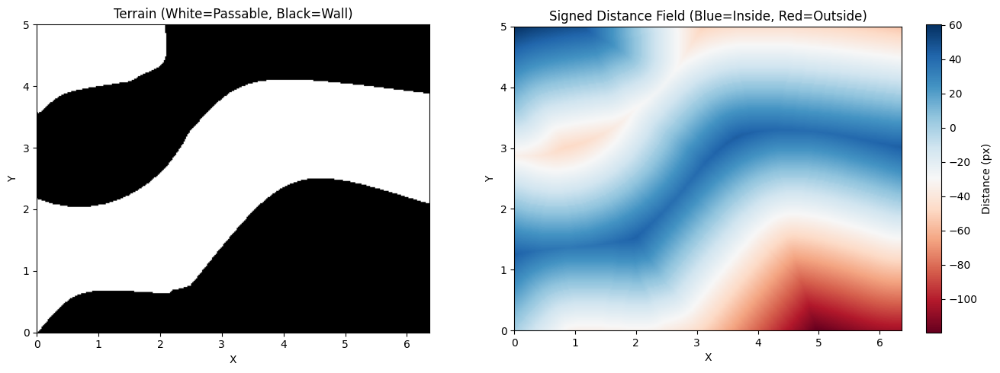

In [5]:
# Step 5: Load Map and Visualize SDF
world_map = WorldMap('map.png', resolution=50.0, origin=(0.0, 0.0))
sdf_data = world_map.to_warp()

# Visualize terrain and SDF
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].imshow(world_map.bitmap, cmap='gray', origin='lower',
               extent=[0, world_map.world_size[0], 0, world_map.world_size[1]])
axes[0].set_title('Terrain (White=Passable, Black=Wall)', fontsize=12)
axes[0].set_xlabel('X'); axes[0].set_ylabel('Y')

im = axes[1].imshow(world_map.sdf, cmap='RdBu', origin='lower',
                    extent=[0, world_map.world_size[0], 0, world_map.world_size[1]])
axes[1].set_title('Signed Distance Field (Blue=Inside, Red=Outside)', fontsize=12)
axes[1].set_xlabel('X'); axes[1].set_ylabel('Y')
plt.colorbar(im, ax=axes[1], label='Distance (px)')
plt.tight_layout()
plt.savefig('sdf_visualization.png', dpi=100)
plt.show()

### 3.4 Re-use Kernels from Previous Tutorials

We import the kernels from previous tutorials (springs, FEM, implicit solver) via `utils.py`.

In [6]:
# Step 6: Physics kernels (imported from utils.py)
# All physics kernels are imported from utils.py. See previous tutorials for implementation details:
# - eval_spring_2d: Spring force kernel (01_explicit.ipynb)
# - eval_fem_2d: FEM force kernel (03_fem.ipynb)
# - build_spring_matrix_2d: Spring stiffness matrix (02_implicit.ipynb)
# - build_fem_matrix_2d: FEM stiffness matrix (03_fem.ipynb)
# - update_state_2d, eval_gravity_2d, apply_boundary_2d: Utility kernels

# Alias for backwards compatibility with this notebook
compute_fem_stiffness_2d = build_fem_matrix_2d

print("Physics kernels imported from utils.py")

Physics kernels imported from utils.py


In [7]:
# Step 7: State and Model classes (imported from utils.py)
# State and Model classes are imported from utils.py
# See previous tutorials for implementation details.
print('State and Model imported from utils.py')

# Create a local Model subclass that uses FEM (same as in 03_fem.ipynb)
class ModelSDF(Model):
    """Model with FEM support for SDF collision tutorial."""
    
    @classmethod
    def from_circle(cls, radius=0.5, num_boundary=20, num_rings=3, device='cuda', boxsize=3.0, center=None):
        model = cls(device=device)
        model.boxsize = boxsize
        if center is None:
            center = (boxsize/2.0, boxsize/2.0)
        cx, cy = center
        
        all_pts = []
        angles = np.linspace(0, 2*np.pi, num_boundary, endpoint=False)
        all_pts.append(np.c_[radius*np.cos(angles), radius*np.sin(angles)])
        for ring in range(1, num_rings+1):
            r = radius * (num_rings-ring+1) / (num_rings+1)
            n = max(8, int(num_boundary * r / radius))
            a = np.linspace(0, 2*np.pi, n, endpoint=False) + np.pi/num_boundary*ring
            all_pts.append(np.c_[r*np.cos(a), r*np.sin(a)])
        all_pts.append([[0.0, 0.0]])
        pts_norm = np.vstack(all_pts)
        
        tri = Delaunay(pts_norm)
        valid_tris = []
        for simplex in tri.simplices:
            cent = np.mean(pts_norm[simplex], axis=0)
            if np.linalg.norm(cent) <= radius * 1.01:
                p0, p1, p2 = pts_norm[simplex]
                cross = (p1-p0)[0]*(p2-p0)[1] - (p1-p0)[1]*(p2-p0)[0]
                if abs(cross) >= 1e-8:
                    if cross < 0:
                        simplex = [simplex[0], simplex[2], simplex[1]]
                    valid_tris.append(simplex)
        
        pts = pts_norm * radius * boxsize / 2.0
        pts[:, 0] += cx
        pts[:, 1] += cy
        
        n = len(pts)
        model.particle_count = n
        model.particle_q = wp.array(pts.astype(np.float32), dtype=wp.vec2, device=device)
        model.particle_qd = wp.zeros(n, dtype=wp.vec2, device=device)
        model.particle_mass = wp.ones(n, dtype=float, device=device)
        model.particle_inv_mass = wp.ones(n, dtype=float, device=device)
        
        edges = set()
        for t in valid_tris:
            for e in [(t[0],t[1]), (t[1],t[2]), (t[2],t[0])]:
                edges.add(tuple(sorted(e)))
        spring_idx, spring_len = [], []
        for v0, v1 in edges:
            spring_idx.extend([v0, v1])
            spring_len.append(np.linalg.norm(pts[v1] - pts[v0]))
        
        model.spring_count = len(edges)
        model.spring_indices = wp.array(np.array(spring_idx, dtype=np.int32), dtype=int, device=device)
        model.spring_rest_length = wp.array(np.array(spring_len, dtype=np.float32), dtype=float, device=device)
        model.spring_stiffness = wp.full(model.spring_count, 40.0, dtype=float, device=device)
        model.spring_damping = wp.full(model.spring_count, 0.5, dtype=float, device=device)
        model.spring_strains = wp.zeros(model.spring_count, dtype=float, device=device)
        
        tri_idx = []
        for t in valid_tris:
            tri_idx.extend(t)
        model.tri_count = len(valid_tris)
        model.tri_indices = wp.array(np.array(tri_idx, dtype=np.int32), dtype=int, device=device)
        model.tri_strains = wp.zeros(model.tri_count, dtype=float, device=device)
        
        poses = []
        for t in valid_tris:
            p0, p1, p2 = pts[t[0]], pts[t[1]], pts[t[2]]
            e1, e2 = p1-p0, p2-p0
            Dm = np.array([[e1[0],e2[0]], [e1[1],e2[1]]], dtype=np.float32)
            poses.append(np.linalg.inv(Dm).flatten())
        model.tri_poses = wp.array(np.array(poses, dtype=np.float32), dtype=wp.mat22, device=device)
        
        E, nu = 50.0, 0.3
        k_mu = E / (2*(1+nu))
        k_lambda = E*nu / (1-nu*nu)
        model.tri_materials = wp.full(model.tri_count, wp.vec3(k_mu, k_lambda, 2.0), dtype=wp.vec3, device=device)
        
        model.set_gravity((0.0, -0.3))
        print(f"Circle: {n} particles, {model.spring_count} springs, {model.tri_count} triangles")
        return model

print("State and Model defined")

State and Model imported from utils.py
State and Model defined


### 3.5 Implicit Solver with SDF Collision

Extend the implicit FEM solver to use SDF-based collision instead of box boundaries.

In [8]:
# Step 8: Implicit Solver with SDF Collision
class SolverImplicitFEM_SDF:
    """Implicit FEM solver with SDF terrain collision."""
    
    def __init__(self, model, sdf_data, dt=0.01, mass=1.0):
        self.model = model
        self.sdf_data = sdf_data
        self.mass = mass
        self.Minv = 1.0 / mass
        
        spr_blk = model.spring_count * 4
        fem_blk = model.tri_count * 9
        total = spr_blk + fem_blk
        
        self.spr_rows = wp.zeros(spr_blk, dtype=wp.int32, device=model.device)
        self.spr_cols = wp.zeros(spr_blk, dtype=wp.int32, device=model.device)
        self.spr_vals = wp.zeros(spr_blk, dtype=wp.mat22f, device=model.device)
        self.fem_rows = wp.zeros(fem_blk, dtype=wp.int32, device=model.device)
        self.fem_cols = wp.zeros(fem_blk, dtype=wp.int32, device=model.device)
        self.fem_vals = wp.zeros(fem_blk, dtype=wp.mat22f, device=model.device)
        self.bsr_rows = wp.zeros(total, dtype=wp.int32, device=model.device)
        self.bsr_cols = wp.zeros(total, dtype=wp.int32, device=model.device)
        self.bsr_vals = wp.zeros(total, dtype=wp.mat22f, device=model.device)
        
        self.A = bsr_zeros(model.particle_count, model.particle_count, wp.mat22f, device=model.device)
        self.M = None
        self.dv = wp.zeros(model.particle_count, dtype=wp.vec2, device=model.device)
        self.colliding = wp.zeros(model.particle_count, dtype=int, device=model.device)
    
    def build_matrix(self, state, dt):
        m = self.model
        wp.launch(build_spring_matrix_2d, dim=m.spring_count, inputs=[
            self.spr_rows, self.spr_cols, self.spr_vals, m.spring_indices,
            m.spring_stiffness, m.spring_damping, wp.float32(dt), self.mass, self.Minv], device=m.device)
        
        wp.launch(compute_fem_stiffness_2d, dim=m.tri_count, inputs=[
            state.particle_q, m.tri_indices, m.tri_poses, m.tri_materials,
            self.fem_rows, self.fem_cols, self.fem_vals, wp.float32(dt)], device=m.device)
        
        sn, fn = m.spring_count * 4, m.tri_count * 9
        wp.copy(self.bsr_rows, self.spr_rows, count=sn)
        wp.copy(self.bsr_cols, self.spr_cols, count=sn)
        wp.copy(self.bsr_vals, self.spr_vals, count=sn)
        wp.copy(self.bsr_rows, self.fem_rows, dest_offset=sn, count=fn)
        wp.copy(self.bsr_cols, self.fem_cols, dest_offset=sn, count=fn)
        wp.copy(self.bsr_vals, self.fem_vals, dest_offset=sn, count=fn)
        
        bsr_set_from_triplets(self.A, self.bsr_rows, self.bsr_cols, self.bsr_vals, prune_numerical_zeros=True)
        self.M = preconditioner(self.A, ptype="diag")
    
    def step(self, state_in, state_out, dt):
        m = self.model
        self.build_matrix(state_in, dt)
        
        spr_f = wp.zeros(m.particle_count, dtype=wp.vec2, device=m.device)
        wp.launch(eval_spring_2d, dim=m.spring_count, inputs=[
            state_in.particle_q, state_in.particle_qd, m.spring_indices,
            m.spring_rest_length, m.spring_stiffness, m.spring_damping,
            spr_f, m.spring_strains], device=m.device)
        
        fem_f = wp.zeros(m.particle_count, dtype=wp.vec2, device=m.device)
        wp.launch(eval_fem_2d, dim=m.tri_count, inputs=[
            state_in.particle_q, state_in.particle_qd, m.tri_indices,
            m.tri_poses, m.tri_materials, fem_f, m.tri_strains], device=m.device)
        
        grav_f = wp.zeros(m.particle_count, dtype=wp.vec2, device=m.device)
        g = m.gravity.numpy()[0]
        wp.launch(eval_gravity_2d, dim=m.particle_count,
                  inputs=[wp.vec2(g[0]*self.mass, g[1]*self.mass)], outputs=[grav_f], device=m.device)
        
        state_in.particle_f = dt * (spr_f + fem_f + grav_f)
        bicgstab(self.A, state_in.particle_f, self.dv, tol=1e-3, maxiter=10, M=self.M, use_cuda_graph=True)
        
        wp.launch(update_state_2d, dim=m.particle_count, inputs=[
            self.dv, dt, state_in.particle_q, state_in.particle_qd,
            state_out.particle_q, state_out.particle_qd], device=m.device)
        
        # SDF collision instead of box boundary!
        wp.launch(apply_sdf_collision_2d, dim=m.particle_count, inputs=[
            state_out.particle_q, state_out.particle_qd,
            self.sdf_data['sdf'], self.sdf_data['sdf_grad_x'], self.sdf_data['sdf_grad_y'],
            self.sdf_data['resolution'], self.sdf_data['origin_x'], self.sdf_data['origin_y'],
            self.sdf_data['width'], self.sdf_data['height'], 0.3, self.colliding
        ], device=m.device)
        
        return state_out

print("SolverImplicitFEM_SDF defined")

SolverImplicitFEM_SDF defined


---
## 4. Simulation

Drop the soft body onto the terrain!

In [ ]:
# Step 9: Run Terrain Simulation
center_x = world_map.world_size[0] / 2
center_y = world_map.world_size[1] * 0.6  # Start in middle-upper area

# SAME body SIZE as all tutorials (1-3, 5): 20 boundary, 3 rings with FEM
# Now navigating through an obstacle course with SDF collision!
model_sdf = ModelSDF.from_circle(
    radius=0.5, num_boundary=20, num_rings=3,
    boxsize=max(world_map.world_size), 
    center=(center_x, center_y)
)
model_sdf.set_gravity((0.0, -0.3))
print(f"SAME body as Tutorials 1-3, now WITH SDF collision:")
print(f"  {model_sdf.particle_count} particles, {model_sdf.tri_count} triangles")

solver_sdf = SolverImplicitFEM_SDF(model_sdf, sdf_data, dt=0.02)

# Simulation
dt_sdf = 0.02
sim_time_sdf = 10.0
steps_sdf = int(sim_time_sdf / dt_sdf)

s_in, s_out = model_sdf.state(), model_sdf.state()

print(f"Running {steps_sdf} steps on terrain...")
start = time.time()

frames_sdf = []
for step in range(steps_sdf):
    solver_sdf.step(s_in, s_out, dt_sdf)
    s_in, s_out = s_out, s_in
    
    if step % 2 == 0:
        frames_sdf.append((
            s_in.particle_q.numpy().copy(),
            model_sdf.spring_strains.numpy().copy(),
            model_sdf.tri_strains.numpy().copy(),
            solver_sdf.colliding.numpy().copy(),
            step * dt_sdf
        ))

elapsed_sdf = time.time() - start
print(f"Completed in {elapsed_sdf:.2f}s ({steps_sdf/elapsed_sdf:.0f} steps/s), {len(frames_sdf)} frames")

Circle: 75 particles, 198 springs, 124 triangles
Body: 24 boundary, 4 rings → 75 particles, 124 triangles
Running 500 steps on terrain...
Module utils f770a49 load on device 'cuda:0' took 1.18 ms  (cached)
Module warp.sparse 9cae4f0 load on device 'cuda:0' took 6.17 ms  (cached)
Module warp.sparse 2c57458 load on device 'cuda:0' took 0.64 ms  (cached)
Module warp.optim.linear f9351dd load on device 'cuda:0' took 0.34 ms  (cached)
Module map_add 1c90bf5 load on device 'cuda:0' took 0.40 ms  (cached)
Module map_mul 6e6c136 load on device 'cuda:0' took 0.36 ms  (cached)
Module warp.optim.linear 8c77de4 load on device 'cuda:0' took 0.53 ms  (cached)
Module warp.optim.linear 78ab57e load on device 'cuda:0' took 0.48 ms  (cached)
Module warp.optim.linear c2e55a4 load on device 'cuda:0' took 0.48 ms  (cached)
Module warp._src.sparse.dyn.bsr_mv_kernel_1396ed11 94ee84b load on device 'cuda:0' took 0.41 ms  (cached)
Module warp.optim.linear db4df7a load on device 'cuda:0' took 0.52 ms  (cached)


---
## 5. Terrain Animation

Pink particles indicate collision with terrain.

In [10]:
# Step 10: Create Terrain Animation
fig, ax = plt.subplots(figsize=(12, 8))
fig.patch.set_facecolor('white')

spring_idx_sdf = model_sdf.spring_indices.numpy().reshape(-1, 2)
tri_sdf = model_sdf.tri_indices.numpy().reshape(-1, 3)

cmap_spring = LinearSegmentedColormap.from_list('spring', ['#FFE066', '#FF8800', '#CC0000'])
cmap_fem = LinearSegmentedColormap.from_list('fem', ['#88DDAA', '#00AACC', '#0044AA'])

def update_sdf(idx):
    pos, strain_spr, strain_fem, coll, t = frames_sdf[idx]
    ax.clear()
    ax.set_facecolor('#f8f8f8')
    
    # Draw terrain in background
    ax.imshow(world_map.bitmap, cmap='Greys_r', origin='lower', alpha=0.8,
              extent=[0, world_map.world_size[0], 0, world_map.world_size[1]])
    
    # Draw FEM triangles
    triang = Triangulation(pos[:,0], pos[:,1], tri_sdf)
    ax.tripcolor(triang, np.clip(np.abs(strain_fem)/max(0.02, np.abs(strain_fem).max()), 0, 1), 
                 cmap=cmap_fem, vmin=0, vmax=1, alpha=0.85)
    
    # Draw springs
    segs = [[pos[v0], pos[v1]] for v0, v1 in spring_idx_sdf]
    lc = LineCollection(segs, cmap=cmap_spring, linewidths=2.0)
    lc.set_array(np.clip(np.abs(strain_spr)/max(0.02, np.abs(strain_spr).max()), 0, 1))
    ax.add_collection(lc)
    
    # Draw particles - PINK when colliding, light blue otherwise
    colors = ['#FF69B4' if c else '#87CEEB' for c in coll]
    ax.scatter(pos[:,0], pos[:,1], s=35, c=colors, edgecolors='white', linewidths=0.8, zorder=5)
    
    ax.set_xlim(0, world_map.world_size[0])
    ax.set_ylim(0, world_map.world_size[1])
    ax.set_aspect('equal')
    ax.set_xticks([]); ax.set_yticks([])
    ax.set_title(f'Soft Body on Terrain (SDF Collision) | t={t:.2f}s', fontsize=14, fontweight='bold')

anim_sdf = FuncAnimation(fig, update_sdf, frames=len(frames_sdf), interval=40, blit=False)
anim_sdf.save('soft_body_terrain.gif', writer=PillowWriter(fps=25))
plt.close()
print(f"Saved soft_body_terrain.gif ({len(frames_sdf)} frames)")

Saved soft_body_terrain.gif (250 frames)


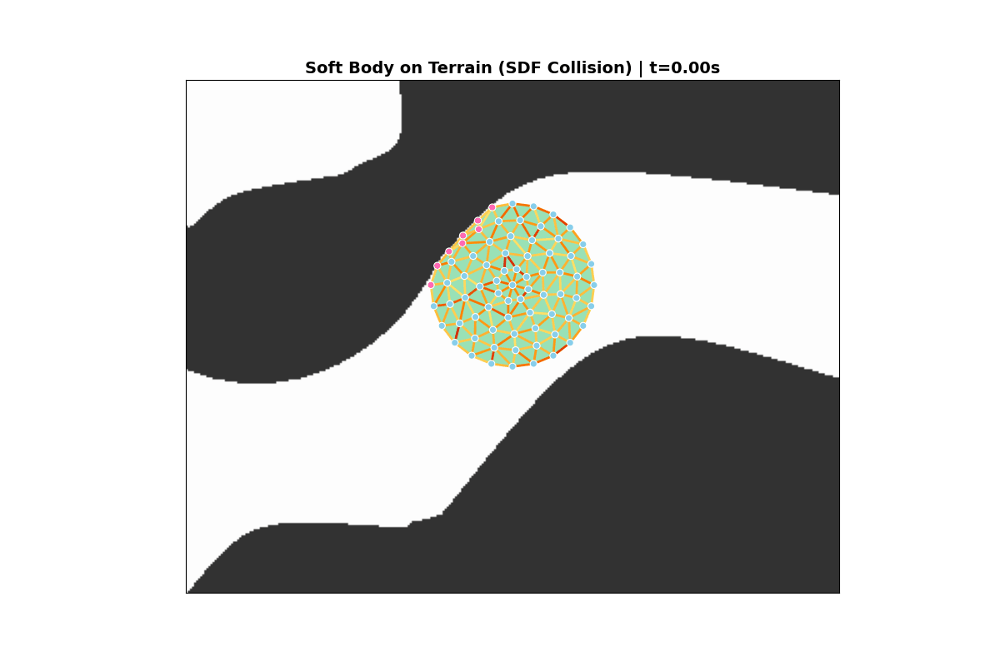

In [11]:
IPImage(filename='soft_body_terrain.gif')

---
## 6. Summary

**What we built:**
1. **SDF Sampling** - Bilinear interpolation for smooth distance queries
2. **Collision Kernel** - GPU-accelerated collision detection using SDF
3. **WorldMap** - Load terrain from bitmap, compute SDF with scipy
4. **Extended Solver** - Combine implicit FEM with terrain collision

**Key Benefits of SDF:**
- **Arbitrary geometry** - Any shape from a bitmap image
- **Smooth normals** - Gradient gives continuous surface direction
- **Efficient** - O(1) lookup per particle
- **Resolution independent** - Bilinear interpolation

**Complete Tutorial Series:**
1. [Explicit Integration](01_explicit.ipynb) - Springs with symplectic Euler
2. [Implicit FEM](02_implicit.ipynb) - Volume-preserving with 80× larger timesteps
3. [SDF Collision](03_sdf.ipynb) - Arbitrary terrain collision (this notebook)

**Further Reading:**
- Baraff & Witkin, "Large Steps in Cloth Simulation," SIGGRAPH 1998
- NVIDIA Warp Documentation: https://nvidia.github.io/warp/